In [1]:
import os
os.environ['MUSDB_PATH'] = '/source_separation/data/'

In [2]:
%load_ext autoreload
%autoreload 2

import musdb
import dotenv

dotenv.load_dotenv()

mus_train = musdb.DB(subsets='train', download=False)
#mus_test = musdb.DB(subsets='test', download=False)

mus_train[0].audio.shape

(7552000, 2)

In [ ]:
from src.datasets.musdb_sigsep_4sources import MusDBSigSep

musdb_dataset = MusDBSigSep(mus_train)
elem_sigsep = musdb_dataset[1]

In [22]:
elem_sigsep['sources_segments_spectrograms'].shape

torch.Size([119, 4, 1025, 173])

In [ ]:
from src.datasets.musdb_segments_4sources import MusDB_segments

data_segments = MusDB_segments(musdb_dataset[0])
mix_segm, source_segm = data_segments[0]
source_segm.shape

torch.Size([4, 1025, 173])

In [24]:
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import clear_output

def plot_losses(train_losses): 
    clear_output()
    plt.figure()
    plt.plot(range(1, len(train_losses)+1), train_losses, label='Train')
    plt.xlabel('Batch')
    plt.ylabel('Loss')
    plt.title(f'Loss curve')
    plt.show()

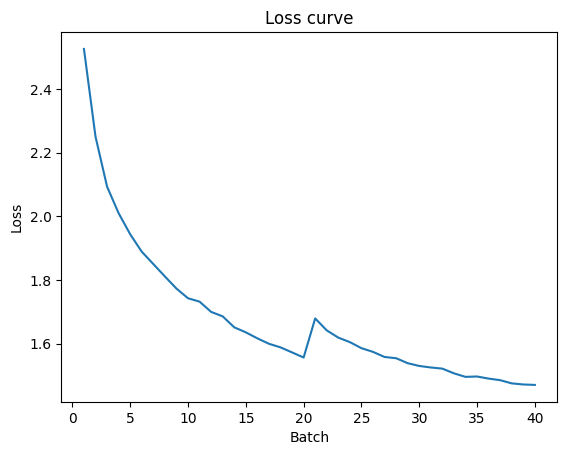

Training finished.


In [25]:
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from src.model.mss_model_final import StandardSeparationUNet
from src.loss.l1_weighted_loss_4sources import loss_function

def train_standard_unet(model, epochs=1, batch_size=4):
    optimizer = torch.optim.AdamW(model.parameters(), lr=1e-3, weight_decay=1e-6)
    scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer, milestones=[20], gamma=0.1)
    
    train_losses = []

    print(f"Starting training for {epochs} epochs...")
    for epoch in range(epochs):
        losses = []
        for n in range(len(musdb_dataset)):
            song = MusDB_segments(musdb_dataset[n])
            dataloader = DataLoader(song, batch_size=batch_size, shuffle=True)
            
            model.train()
            for i, (mixture_batch, sources_batch) in enumerate(dataloader):
                # In this simple dataset, each 'batch' is the entire dataset once
                # mixture is [1, 1, freq, time], true_sources is [1, n_sources, freq, time]
                #print(mixture_batch.shape)
                mixture_input = mixture_batch.unsqueeze(1).to('cuda') # [B, 1, F, T]
                true_sources = sources_batch.to('cuda') # [B, n, F, T]
                
                optimizer.zero_grad()

                #print(f"True {true_sources.shape}")
                # ПРЯМОЙ ПРОХОД: смесь -> источники
                predicted_sources = model(mixture_input) # [B, n_sources, freq, time]
                #print(f"Pred {predicted_sources.shape}")
                # СРАВНЕНИЕ с истинными источниками
                #loss = criterionL1(predicted_sources, true_sources)
                loss = loss_function(predicted_sources, true_sources, alpha= [0.297, 0.262, 0.232, 0.209])
                
                # ОБРАТНЫЙ ПРОХОД
                loss.backward()
                optimizer.step()
                
                losses.append(loss.item())

                if i % 10 == 0: # Print loss for every batch
                    print(f"Epoch [{epoch+1}/{epochs}], Batch [{i+1}/{len(dataloader)}], Loss: {loss.item():.4f}, Song: {n+1}")
        
        scheduler.step()

        # Plot after each epoch
        train_losses += [np.mean(losses)]
        plot_losses(train_losses)
    
    print("Training finished.")

# Model initialization
model = StandardSeparationUNet(n_sources=4)
model = model.to('cuda')

#data_segments = MusDB_segments(elem_sigsep)
# Train the model
train_standard_unet(model, epochs=40)

In [26]:
torch.save(model.state_dict(), 'model_weights_final4_sources.pth')

In [55]:
import numpy as np

def get_full_song():
  preds = []
  data_segments = MusDB_segments(musdb_dataset[5])
  dataloader = DataLoader(data_segments, batch_size=8, shuffle=False)
  model.eval()  # Set to evaluation mode
  with torch.no_grad():
    for i, (mixture, source) in enumerate(dataloader):
      mixture = mixture.unsqueeze(1).to('cuda')
      pred = model(mixture)
      preds.append(pred[:,0].cpu())

  v_predict = [np.hstack(vocal) for vocal in preds] # Stack segments in a batch
  full_pred_spectrogram = np.hstack(v_predict)[:,:14073] # Stack remaining segments
  full_pred_spectrogram = torch.tensor(full_pred_spectrogram)
  return full_pred_spectrogram

full_pred_spectrogram = get_full_song()

In [ ]:
import librosa

audio = mus_train[5].audio[:, 0]

stft_transform = librosa.stft(audio, n_fft=2048, win_length=2048, hop_length=512)
spectrogram = librosa.power_to_db(np.abs(stft_transform)**2)
spectrogram.shape

c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


(1025, 14073)

In [57]:
complex_segment_phases = librosa.magphase(stft_transform)[1]
complex_valued_spectrogram = np.multiply(complex_segment_phases, np.array(full_pred_spectrogram))
reconstructed_audio = librosa.istft(complex_valued_spectrogram, hop_length=512, win_length = 2048)
reconstructed_audio

array([0., 0., 0., ..., 0., 0., 0.])

In [58]:
reconstructed_audio_tensor = torch.tensor(reconstructed_audio).unsqueeze(0)
reconstructed_audio_tensor.shape

torch.Size([1, 7204864])

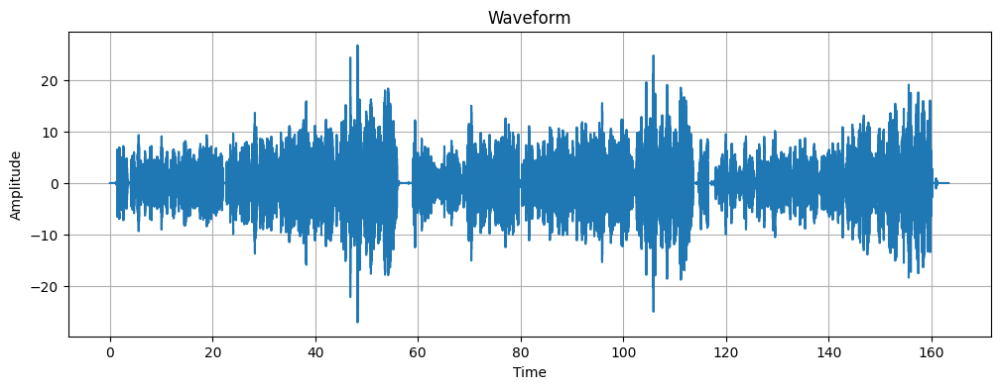

In [59]:
from IPython import display
import matplotlib.pyplot as plt
import numpy as np

def plot_waveform(waveform, title="Waveform", xlim=None, ylim=None):
    sample_rate = 44100
    time_axis = np.arange(0, waveform.shape[1]) / sample_rate

    plt.figure(figsize=(12, 4))
    plt.title(title)
    plt.plot(time_axis, waveform[0])
    if xlim:
        plt.xlim(xlim)
    if ylim:
        plt.ylim(ylim)
    plt.xlabel("Time")
    plt.ylabel("Amplitude")
    plt.grid()
    plt.show()

    display.display(display.Audio(waveform, rate=sample_rate, normalize=True))

plot_waveform(reconstructed_audio_tensor)